In [4]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
from pandas.plotting import scatter_matrix

plt.style.use('ggplot')
%matplotlib inline
pd.options.display.max_rows = 85
pd.options.display.max_columns = 200

# Data Cleaning

In [26]:
dftrain = pd.read_csv('data/train_set.csv')
dftest = pd.read_csv('data/test_set.csv')

dftrain.drop(dftrain.columns[0], axis=1, inplace=True)
dftest.drop(dftest.columns[0], axis=1, inplace=True)

In [34]:
# Test set had additional columns after converting from Apple's Number app. Dropping those.
dftest.drop(dftest.columns[[33,34,35]], axis=1, inplace=True)

In [70]:
# Filtering out columns with NaN to 0. 
# Confirmed that all stats value with NaN(0) are due to 0 attempts.

fill_col = ['FG%', '3P%', '2P%', 'eFG%', 'FT%']
dftrain[fill_col] = dftrain[fill_col].fillna(value=0)
dftest[fill_col] = dftest[fill_col].fillna(value=0)

In [79]:
# 370 rows that were deleted due to no salary info. This accounts to 4.2% of data loss.

nosal = dftrain['Salary'].isnull()
no_sal_df = dftrain[nosal]
no_sal_df

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
30,MarioBennett2000,MarioBennett,PF,26,LAC,1,0,3.0,0.0,3.0,0.000,0.0,0.0,0.000,0.0,3.0,0.000,0.000,0.0,0.0,0.000,1.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,NaN,2000,34000000
37,EtdrickBohannon2000,EtdrickBohannon,PF,26,TOT,13,0,9.1,0.5,1.0,0.538,0.0,0.0,0.000,0.5,1.0,0.538,0.538,1.2,1.8,0.625,1.0,1.4,2.4,0.4,0.2,0.5,0.8,1.9,2.2,NaN,2000,34000000
141,KiwaneLemorrisGarris2000,KiwaneLemorrisGarris,SG,25,ORL,3,0,7.7,0.7,3.3,0.200,0.0,0.3,0.000,0.7,3.0,0.222,0.200,0.0,0.0,0.000,0.0,0.3,0.3,0.7,0.0,0.0,0.3,0.0,1.3,NaN,2000,34000000
201,KevinJohnson2000,KevinJohnson,PG,33,PHO,6,0,18.8,2.7,4.7,0.571,0.2,0.2,1.000,2.5,4.5,0.556,0.589,1.2,1.2,1.000,0.0,2.7,2.7,4.0,0.3,0.0,1.2,1.0,6.7,NaN,2000,34000000
207,PopeyeJones2000,PopeyeJones,PF,29,DEN,40,1,8.3,1.1,2.6,0.423,0.1,0.1,0.667,1.1,2.5,0.416,0.433,0.4,0.5,0.737,1.0,1.6,2.6,0.5,0.1,0.2,0.3,1.3,2.6,NaN,2000,34000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8661,XavierRathan-Mayes2018,XavierRathan-Mayes,SG,23,MEM,5,0,23.6,2.4,8.4,0.286,0.2,2.8,0.071,2.2,5.6,0.393,0.298,0.8,1.8,0.444,0.0,1.0,1.0,3.6,1.2,0.6,2.2,3.6,5.8,NaN,2018,99093000
8681,DennisSchroder2018,DennisSchroder,PG,24,ATL,67,67,31.0,7.5,17.1,0.436,1.1,3.9,0.290,6.3,13.2,0.480,0.469,3.4,4.0,0.849,0.7,2.4,3.1,6.2,1.1,0.1,2.7,2.2,19.4,NaN,2018,99093000
8695,IshSmith2018,IshSmith,PG,29,DET,82,35,24.9,4.7,9.8,0.486,0.4,1.2,0.347,4.3,8.5,0.506,0.507,1.0,1.4,0.698,0.3,2.4,2.7,4.4,0.8,0.2,1.3,1.7,10.9,NaN,2018,99093000
8759,LouWilliams2018,LouWilliams,SG,31,LAC,79,19,32.8,7.4,16.9,0.435,2.4,6.6,0.359,5.0,10.4,0.484,0.505,5.5,6.2,0.880,0.5,2.0,2.5,5.3,1.1,0.2,3.0,1.3,22.6,NaN,2018,99093000


In [82]:
# Dropping rows with NaN in Salary.

dftrain_drop = dftrain.dropna()
dftrc = dftrain_drop.reset_index(drop=True)

In [85]:
dftrc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8410 entries, 0 to 8409
Data columns (total 33 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         8410 non-null   object 
 1   Player     8410 non-null   object 
 2   Pos        8410 non-null   object 
 3   Age        8410 non-null   int64  
 4   Tm         8410 non-null   object 
 5   G          8410 non-null   int64  
 6   GS         8410 non-null   int64  
 7   MP         8410 non-null   float64
 8   FG         8410 non-null   float64
 9   FGA        8410 non-null   float64
 10  FG%        8410 non-null   float64
 11  3P         8410 non-null   float64
 12  3PA        8410 non-null   float64
 13  3P%        8410 non-null   float64
 14  2P         8410 non-null   float64
 15  2PA        8410 non-null   float64
 16  2P%        8410 non-null   float64
 17  eFG%       8410 non-null   float64
 18  FT         8410 non-null   float64
 19  FTA        8410 non-null   float64
 20  FT%     

#### Trained set  = dftrc
#### Test set = df_test

# EDA

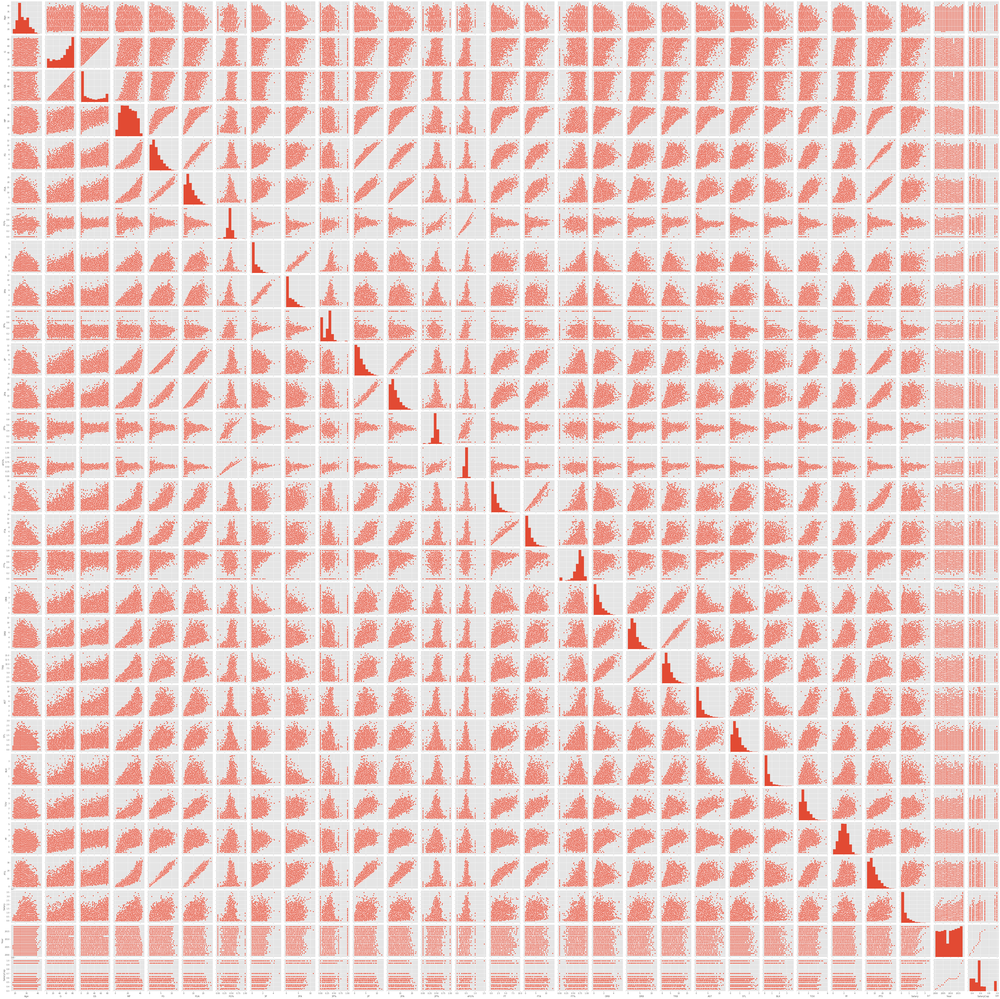

In [86]:
sns.pairplot(dftrc)

In [89]:
dftrc

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
0,TariqAbdul-Wahad2000,TariqAbdul-Wahad,SG,25,TOT,61,56,25.9,4.5,10.6,0.424,0.0,0.4,0.130,4.4,10.2,0.435,0.426,2.4,3.2,0.756,1.7,3.1,4.8,1.6,1.0,0.5,1.7,2.4,11.4,1594920.0,2000,34000000
1,ShareefAbdur-Rahim2000,ShareefAbdur-Rahim,SF,23,VAN,82,82,39.3,7.2,15.6,0.465,0.4,1.2,0.302,6.9,14.4,0.478,0.477,5.4,6.7,0.809,2.7,7.4,10.1,3.3,1.1,1.1,3.0,3.0,20.3,9000000.0,2000,34000000
2,CoryAlexander2000,CoryAlexander,PG,26,DEN,29,2,11.3,1.0,3.4,0.286,0.3,1.2,0.257,0.7,2.2,0.302,0.332,0.6,0.8,0.773,0.3,1.2,1.4,2.0,0.8,0.1,1.0,1.3,2.8,1980000.0,2000,34000000
3,RayAllen2000,RayAllen,SG,24,MIL,82,82,37.4,7.8,17.2,0.455,2.1,5.0,0.423,5.7,12.2,0.468,0.516,4.3,4.9,0.887,1.0,3.4,4.4,3.8,1.3,0.2,2.2,2.3,22.1,9000000.0,2000,34000000
4,RaferAlston2000,RaferAlston,PG,23,MIL,27,0,13.4,1.0,3.5,0.284,0.1,0.5,0.214,0.9,3.0,0.296,0.300,0.1,0.1,0.750,0.2,0.7,0.9,2.6,0.4,0.0,1.1,1.1,2.2,301875.0,2000,34000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8405,CodyZeller2018,CodyZeller,C,25,CHO,33,0,19.0,2.6,4.7,0.545,0.1,0.1,0.667,2.5,4.6,0.542,0.551,1.8,2.6,0.718,2.0,3.3,5.4,0.9,0.4,0.6,1.0,2.5,7.1,12584270.0,2018,99093000
8406,TylerZeller2018,TylerZeller,C,28,TOT,66,34,16.8,2.8,5.1,0.560,0.2,0.4,0.357,2.7,4.6,0.578,0.575,0.9,1.2,0.722,1.7,3.0,4.6,0.7,0.2,0.5,0.7,1.9,6.7,1709538.0,2018,99093000
8407,PaulZipser2018,PaulZipser,SF,23,CHI,54,12,15.3,1.5,4.3,0.346,0.7,2.0,0.336,0.8,2.3,0.355,0.425,0.4,0.5,0.760,0.2,2.2,2.4,0.9,0.4,0.3,0.8,1.6,4.0,1312611.0,2018,99093000
8408,AnteZizic2018,AnteZizic,C,21,CLE,32,2,6.7,1.5,2.1,0.731,0.0,0.0,0.000,1.5,2.1,0.731,0.731,0.7,0.9,0.724,0.8,1.1,1.9,0.2,0.1,0.4,0.3,0.9,3.7,1645200.0,2018,99093000


In [101]:
avgsal = dftrc.groupby('Year').mean()['Salary']
avgcap = dftrc.groupby('Year').mean()['SalaryCap']

In [167]:
avgsal/1000000

Year
2000    2.900958
2001    3.443190
2002    3.486782
2003    3.691907
2004    3.722654
2005    3.860023
2006    4.051854
2007    4.112700
2008    4.482297
2009    4.715358
2010    4.633563
2011    4.471326
2012    4.371313
2013    4.333937
2014    4.291798
2015    4.388380
2016    4.893632
2017    5.960393
2018    6.028249
Name: Salary, dtype: float64

In [146]:
avgcap

Year
2000    34000000.0
2001    35500000.0
2002    42500000.0
2003    40271000.0
2004    43840000.0
2005    43870000.0
2006    49500000.0
2007    53135000.0
2008    55630000.0
2009    58680000.0
2010    57700000.0
2011    58044000.0
2012    58044000.0
2013    58044000.0
2014    58679000.0
2015    63065000.0
2016    70000000.0
2017    94143000.0
2018    99093000.0
Name: SalaryCap, dtype: float64

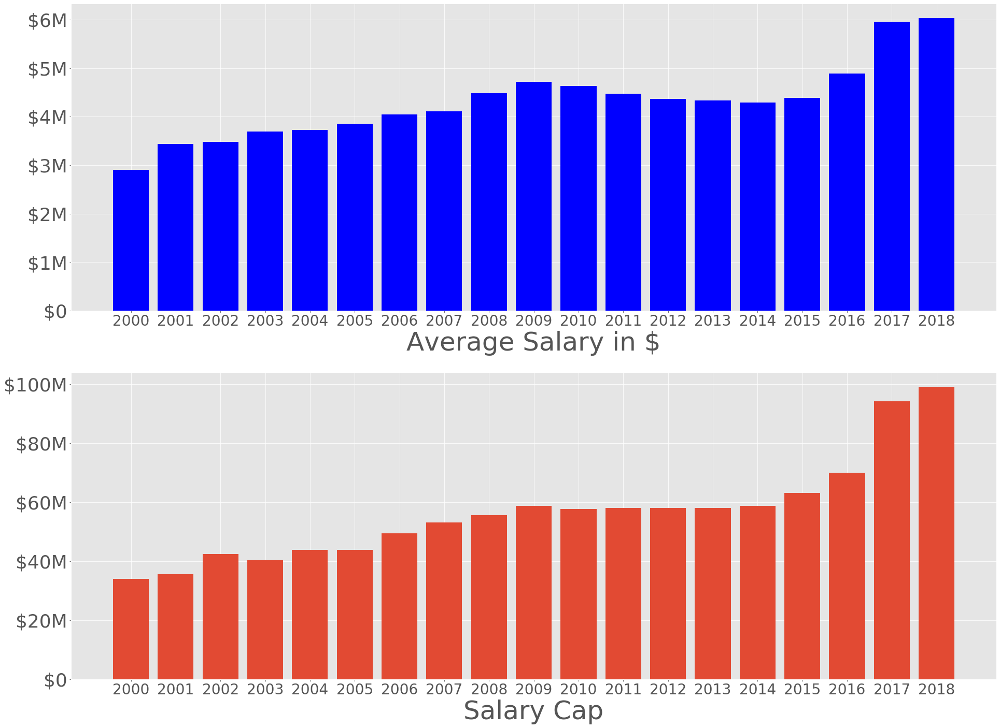

In [168]:
# Ploting average salary and salary cap over the years (Raw $ Amount)

fig, ax = plt.subplots(2,1, figsize=(32,24))
index = np.arange(2000,2019)
xlabel = 50
xtick = 28
ytick = 36

ax[0].bar(index, avgsal, color='b')
ax[0].set_xlabel('Average Salary in $', size=xlabel)

ax[0].set_xticks(index)
ax[0].set_xticklabels(index, size=xtick)
ax[0].set_yticklabels(['$0', '$1M', '$2M', '$3M', '$4M', '$5M', '$6M'], size=ytick)


ax[1].bar(index, avgcap)
ax[1].set_xlabel('Salary Cap', size=xlabel)

ax[1].set_xticks(index)
ax[1].set_xticklabels(index, size=xtick)

ax[1].set_yticklabels(['$0', '$20M', '$40M', '$60M', '$80M', '$100M'], size=ytick)
plt.show()

# Normalizing Salary

In [165]:
dftrnorm = dftrc.copy()

In [166]:
dftrnorm

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
0,TariqAbdul-Wahad2000,TariqAbdul-Wahad,SG,25,TOT,61,56,25.9,4.5,10.6,0.424,0.0,0.4,0.130,4.4,10.2,0.435,0.426,2.4,3.2,0.756,1.7,3.1,4.8,1.6,1.0,0.5,1.7,2.4,11.4,1594920.0,2000,34000000
1,ShareefAbdur-Rahim2000,ShareefAbdur-Rahim,SF,23,VAN,82,82,39.3,7.2,15.6,0.465,0.4,1.2,0.302,6.9,14.4,0.478,0.477,5.4,6.7,0.809,2.7,7.4,10.1,3.3,1.1,1.1,3.0,3.0,20.3,9000000.0,2000,34000000
2,CoryAlexander2000,CoryAlexander,PG,26,DEN,29,2,11.3,1.0,3.4,0.286,0.3,1.2,0.257,0.7,2.2,0.302,0.332,0.6,0.8,0.773,0.3,1.2,1.4,2.0,0.8,0.1,1.0,1.3,2.8,1980000.0,2000,34000000
3,RayAllen2000,RayAllen,SG,24,MIL,82,82,37.4,7.8,17.2,0.455,2.1,5.0,0.423,5.7,12.2,0.468,0.516,4.3,4.9,0.887,1.0,3.4,4.4,3.8,1.3,0.2,2.2,2.3,22.1,9000000.0,2000,34000000
4,RaferAlston2000,RaferAlston,PG,23,MIL,27,0,13.4,1.0,3.5,0.284,0.1,0.5,0.214,0.9,3.0,0.296,0.300,0.1,0.1,0.750,0.2,0.7,0.9,2.6,0.4,0.0,1.1,1.1,2.2,301875.0,2000,34000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8405,CodyZeller2018,CodyZeller,C,25,CHO,33,0,19.0,2.6,4.7,0.545,0.1,0.1,0.667,2.5,4.6,0.542,0.551,1.8,2.6,0.718,2.0,3.3,5.4,0.9,0.4,0.6,1.0,2.5,7.1,12584270.0,2018,99093000
8406,TylerZeller2018,TylerZeller,C,28,TOT,66,34,16.8,2.8,5.1,0.560,0.2,0.4,0.357,2.7,4.6,0.578,0.575,0.9,1.2,0.722,1.7,3.0,4.6,0.7,0.2,0.5,0.7,1.9,6.7,1709538.0,2018,99093000
8407,PaulZipser2018,PaulZipser,SF,23,CHI,54,12,15.3,1.5,4.3,0.346,0.7,2.0,0.336,0.8,2.3,0.355,0.425,0.4,0.5,0.760,0.2,2.2,2.4,0.9,0.4,0.3,0.8,1.6,4.0,1312611.0,2018,99093000
8408,AnteZizic2018,AnteZizic,C,21,CLE,32,2,6.7,1.5,2.1,0.731,0.0,0.0,0.000,1.5,2.1,0.731,0.731,0.7,0.9,0.724,0.8,1.1,1.9,0.2,0.1,0.4,0.3,0.9,3.7,1645200.0,2018,99093000


In [169]:
dftrnorm['Salary'] = dftrnorm['Salary'] / dftrnorm['SalaryCap']

In [170]:
dftrnorm

,id,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Salary,Year,SalaryCap
0,TariqAbdul-Wahad2000,TariqAbdul-Wahad,SG,25,TOT,61,56,25.9,4.5,10.6,0.424,0.0,0.4,0.130,4.4,10.2,0.435,0.426,2.4,3.2,0.756,1.7,3.1,4.8,1.6,1.0,0.5,1.7,2.4,11.4,0.046909,2000,34000000
1,ShareefAbdur-Rahim2000,ShareefAbdur-Rahim,SF,23,VAN,82,82,39.3,7.2,15.6,0.465,0.4,1.2,0.302,6.9,14.4,0.478,0.477,5.4,6.7,0.809,2.7,7.4,10.1,3.3,1.1,1.1,3.0,3.0,20.3,0.264706,2000,34000000
2,CoryAlexander2000,CoryAlexander,PG,26,DEN,29,2,11.3,1.0,3.4,0.286,0.3,1.2,0.257,0.7,2.2,0.302,0.332,0.6,0.8,0.773,0.3,1.2,1.4,2.0,0.8,0.1,1.0,1.3,2.8,0.058235,2000,34000000
3,RayAllen2000,RayAllen,SG,24,MIL,82,82,37.4,7.8,17.2,0.455,2.1,5.0,0.423,5.7,12.2,0.468,0.516,4.3,4.9,0.887,1.0,3.4,4.4,3.8,1.3,0.2,2.2,2.3,22.1,0.264706,2000,34000000
4,RaferAlston2000,RaferAlston,PG,23,MIL,27,0,13.4,1.0,3.5,0.284,0.1,0.5,0.214,0.9,3.0,0.296,0.300,0.1,0.1,0.750,0.2,0.7,0.9,2.6,0.4,0.0,1.1,1.1,2.2,0.008879,2000,34000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8405,CodyZeller2018,CodyZeller,C,25,CHO,33,0,19.0,2.6,4.7,0.545,0.1,0.1,0.667,2.5,4.6,0.542,0.551,1.8,2.6,0.718,2.0,3.3,5.4,0.9,0.4,0.6,1.0,2.5,7.1,0.126995,2018,99093000
8406,TylerZeller2018,TylerZeller,C,28,TOT,66,34,16.8,2.8,5.1,0.560,0.2,0.4,0.357,2.7,4.6,0.578,0.575,0.9,1.2,0.722,1.7,3.0,4.6,0.7,0.2,0.5,0.7,1.9,6.7,0.017252,2018,99093000
8407,PaulZipser2018,PaulZipser,SF,23,CHI,54,12,15.3,1.5,4.3,0.346,0.7,2.0,0.336,0.8,2.3,0.355,0.425,0.4,0.5,0.760,0.2,2.2,2.4,0.9,0.4,0.3,0.8,1.6,4.0,0.013246,2018,99093000
8408,AnteZizic2018,AnteZizic,C,21,CLE,32,2,6.7,1.5,2.1,0.731,0.0,0.0,0.000,1.5,2.1,0.731,0.731,0.7,0.9,0.724,0.8,1.1,1.9,0.2,0.1,0.4,0.3,0.9,3.7,0.016603,2018,99093000
